# 데이터 불러오기

In [ ]:
!unzip /content/new_dataset.zip -d /content/

In [ ]:
!unzip /content/train.zip -d/content/

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: /content/train/train_defected_dataset/seaweed_02556.png  
  inflating: /content/train/train_defected_dataset/seaweed_04533.png  
  inflating: /content/train/train_defected_dataset/seaweed_03663.png  
  inflating: /content/train/train_defected_dataset/seaweed_02156.png  
  inflating: /content/train/train_defected_dataset/seaweed_04642.png  
  inflating: /content/train/train_defected_dataset/seaweed_04480.png  
  inflating: /content/train/train_defected_dataset/seaweed_02224.png  
  inflating: /content/train/train_defected_dataset/seaweed_02973.png  
  inflating: /content/train/train_defected_dataset/seaweed_04494.png  
  inflating: /content/train/train_defected_dataset/seaweed_04241.png  
  inflating: /content/train/train_defected_dataset/seaweed_02624.png  
  inflating: /content/train/train_defected_dataset/seaweed_01463.png  
  inflating: /content/train/train_defected_dataset/seaweed_02542.png  
  inflating: /content/train/train_defecte

In [ ]:
!unzip /content/validation.zip -d/content/

Archive:  /content/validation-20240902T084428Z-001.zip
  inflating: /content/validation/validation_pure_dataset/seaweed_01171.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01038.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01004.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01158.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01206.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01170.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01010.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01212.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01164.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01005.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01213.jpg  
  inflating: /content/validation/validation_pure_dataset/seaweed_01011.jpg  
  inflating: /content

# 라벨링 세분화 (색상별 클러스터링)

## 1차 클러스터링 - 자동

In [ ]:
import os
import json
from collections import Counter
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import numpy as np
from sklearn.cluster import KMeans

In [ ]:
json_folder_path = '/content/train/train_defected_json'
image_folder_path = '/content/train/train_defected_dataset'

In [ ]:
# 바운딩 박스 X,Y좌표 저장

bbox_info = {'st': [], 'aq': [], 'fl': []}

for json_file in os.listdir(json_folder_path):
    if json_file.endswith('.json'):
        with open(os.path.join(json_folder_path, json_file), 'r') as f:
            data = json.load(f)
            defect_class = data['defect_class']
            if defect_class in bbox_info:
                image_name = data['image_name']
                top_x = data['top_x']
                top_y = data['top_y']
                bot_x = data['bot_x']
                bot_y = data['bot_y']
                bbox_info[defect_class].append((image_name, top_x, top_y, bot_x, bot_y))

In [ ]:
average_colors = {'st': [], 'aq': [], 'fl': []}

# 각 결함 유형별로 이미지 처리 및 색상 추출
for defect, bboxes in bbox_info.items():
    for bbox in bboxes:
        image_name, top_x, top_y, bot_x, bot_y = bbox
        image_path = os.path.join(image_folder_path, image_name)
        img = Image.open(image_path) # Colab 이므로 RGB 변환 필요
        if img.mode != 'RGB':
            img = img.convert("RGB")

        # 이미지의 RGB 값을 numpy 배열로 변환
        cropped_img = img.crop((top_x, top_y, bot_x, bot_y))
        cropped_img_np = np.array(cropped_img)

        # 배경이 어두운 픽셀을 제외하고 밝은 픽셀만 선택
        mask = np.mean(cropped_img_np, axis=2) > 40  # 밝기 임계값 40
        bright_pixels = cropped_img_np[mask]

        # 배경이 너무 어두워, 색상 분석이 어려운 경우 처리
        if bright_pixels.size == 0:
            continue

        # 평균 색상 np 추출
        avg_color = np.mean(bright_pixels, axis=0)
        average_colors[defect].append(avg_color)

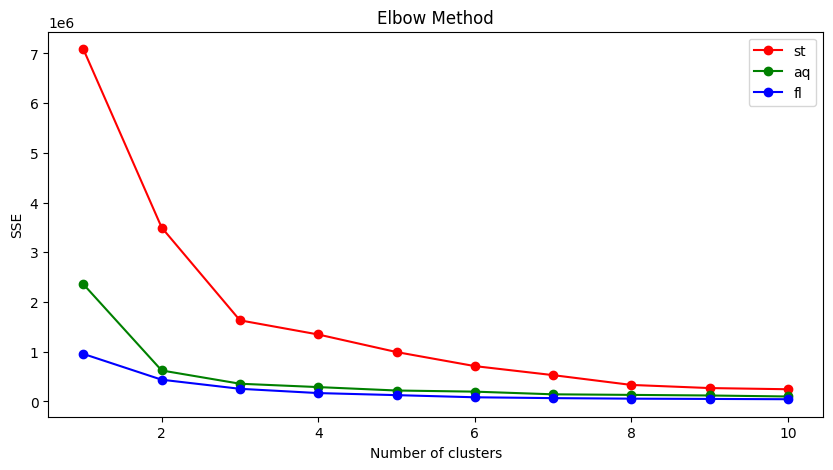

In [ ]:
# 각 결함 유형별로 최적의 클러스터 개수를 찾고 클러스터링 수행
optimal_clusters = {}

def find_optimal_clusters_and_plot(data_dict, max_k, colors):
    plt.figure(figsize=(10, 5))

    for defect, data in data_dict.items():
        if len(data) > 0:
            sse = []
            for k in range(1, max_k + 1):
                kmeans = KMeans(n_clusters=k)
                kmeans.fit(data)
                sse.append(kmeans.inertia_)  # SSE 값 저장

            # 그래프에 각 결함 유형별로 다른 색상으로 표시
            plt.plot(range(1, max_k + 1), sse, marker='o', color=colors[defect], label=f'{defect}')

    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('SSE')
    plt.legend()
    plt.show()

color_map = { 'aq': 'g', 'fl': 'b', 'st': 'r'}
find_optimal_clusters_and_plot(average_colors, max_k=10, colors=color_map)

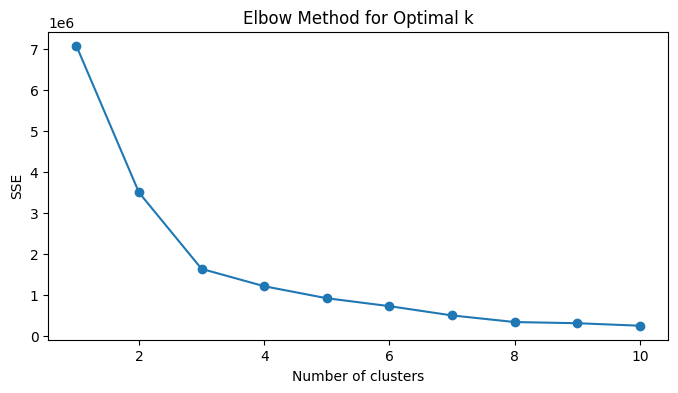

Enter the optimal number of clusters for st: 7


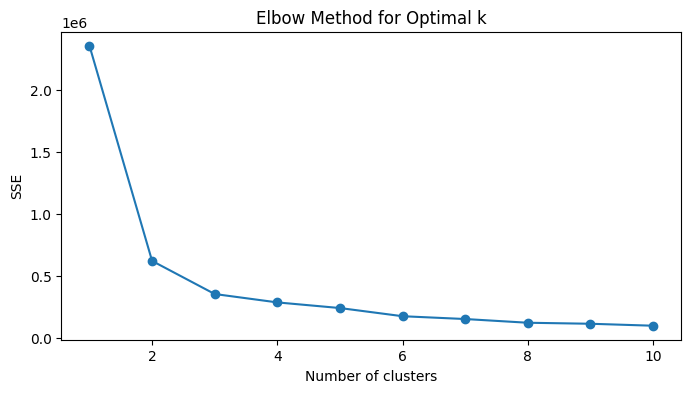

Enter the optimal number of clusters for aq: 10


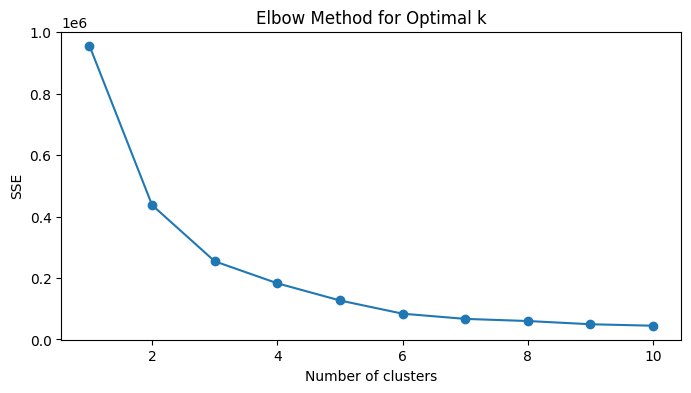

Enter the optimal number of clusters for fl: 7


In [ ]:
# 엘보우 함수
def find_optimal_clusters(data, max_k):
    sse = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)  # SSE 값 저장
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, max_k + 1), sse, marker='o')
    plt.title('Elbow Method for Optimal k')
    plt.xlabel('Number of clusters')
    plt.ylabel('SSE')
    plt.show()

# 최적의 클러스터 개수 입력, 클러스터링 수행
file_clusters = {'st': {}, 'aq': {}, 'fl': {}}
optimal_clusters = {}

for defect, colors in average_colors.items():
    if len(colors) > 0:
        find_optimal_clusters(colors, max_k=10)  # 최적의 클러스터 수를 찾기 위해 10까지 시도

        # 클러스터 수를 사용자 입력으로 받음
        optimal_k = int(input(f"Enter the optimal number of clusters for {defect}: "))
        optimal_clusters[defect] = optimal_k

        # 최적의 클러스터 수로 K-means 클러스터링 수행
        kmeans = KMeans(n_clusters=optimal_clusters[defect])
        kmeans.fit(colors)
        labels = kmeans.labels_

        # 각 클러스터별 파일 이름 저장
        for i, label in enumerate(labels):
            if label not in file_clusters[defect]:
                file_clusters[defect][label] = []
            file_clusters[defect][label].append(bbox_info[defect][i][0])

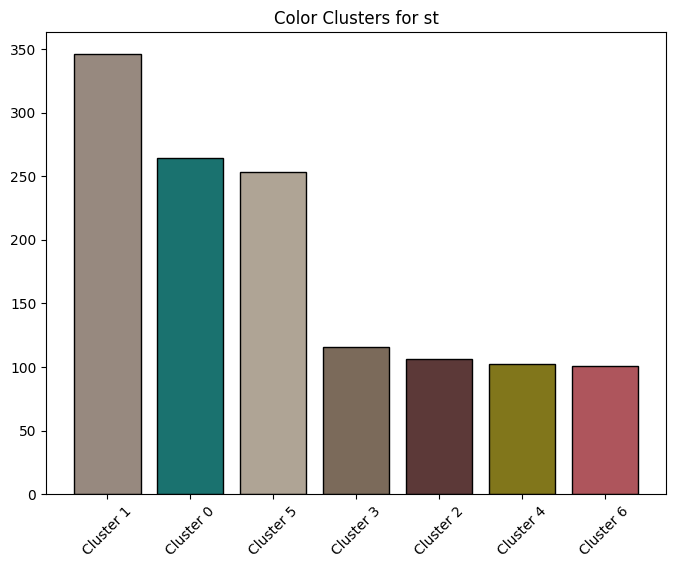

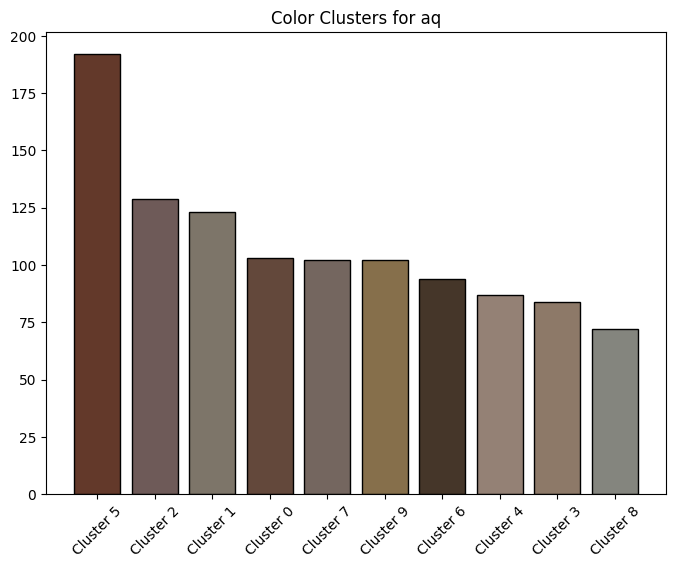

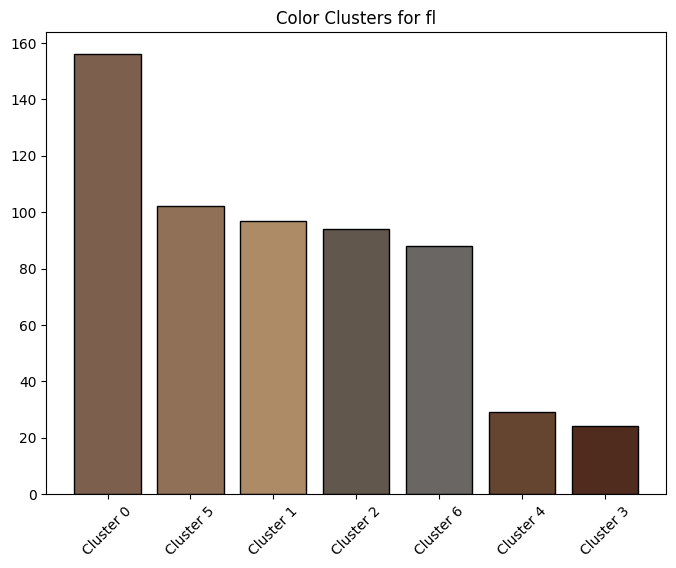

In [ ]:
# 각 결함 유형별로 색상 클러스터링 수행

for defect, colors in average_colors.items():
    if len(colors) > 0:
        kmeans = KMeans(n_clusters=optimal_clusters[defect])  # 최적의 클러스터 개수를 사용
        kmeans.fit(colors)
        labels = kmeans.labels_

        # 각 클러스터에 속한 색상 개수 별 내립차순
        unique, counts = np.unique(labels, return_counts=True)
        sorted_clusters = sorted(zip(unique, counts), key=lambda x: x[1], reverse=True)

        # 시각화
        plt.figure(figsize=(8, 6))
        for i, (cluster, count) in enumerate(sorted_clusters):
            plt.bar(i, count,
                color=np.array(kmeans.cluster_centers_[cluster]) / 255,  # 클러스터 색상
                edgecolor='black')
        plt.xticks(range(len(sorted_clusters)), [f"Cluster {cluster}" for cluster, _ in sorted_clusters], rotation=45)
        plt.title(f"Color Clusters for {defect}")
        plt.show()

In [ ]:
## 클러스터별 결함 이미지 시각화

def visualize_defects_by_cluster(defect, bbox_info, file_clusters, image_folder_path, num_per_row=10):
    for cluster, files in file_clusters[defect].items():
        num_files = len(files)
        num_rows = (num_files // num_per_row) + (1 if num_files % num_per_row != 0 else 0)  # 행 수 계산
        fig, axs = plt.subplots(num_rows, num_per_row, figsize=(20, 4 * num_rows))
        fig.suptitle(f'Cluster {cluster} - {defect}', fontsize=16)

        for idx, file_name in enumerate(files):
            image_path = os.path.join(image_folder_path, file_name)
            img = Image.open(image_path)

            # 바운딩 박스 정보 추출
            bbox_idx = next(i for i, info in enumerate(bbox_info[defect]) if info[0] == file_name)
            top_x, top_y, bot_x, bot_y = bbox_info[defect][bbox_idx][1:5]
            cropped_img = img.crop((top_x, top_y, bot_x, bot_y))

            # 이미지를 subplot에 표시
            row = idx // num_per_row
            col = idx % num_per_row
            axs[row, col].imshow(cropped_img)
            axs[row, col].axis('off')

            # 파일명 표시
            file_number = file_name.split('_')[-1].split('.')[0]
            axs[row, col].set_title(file_number, fontsize=10)

        # 남은 subplot을 비워두기 (이미지 개수가 모자랄 경우)
        for j in range(num_files, num_rows * num_per_row):
            row = j // num_per_row
            col = j % num_per_row
            axs[row, col].axis('off')

        plt.tight_layout()
        plt.show()

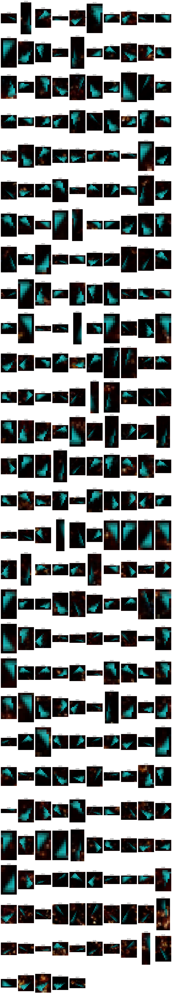

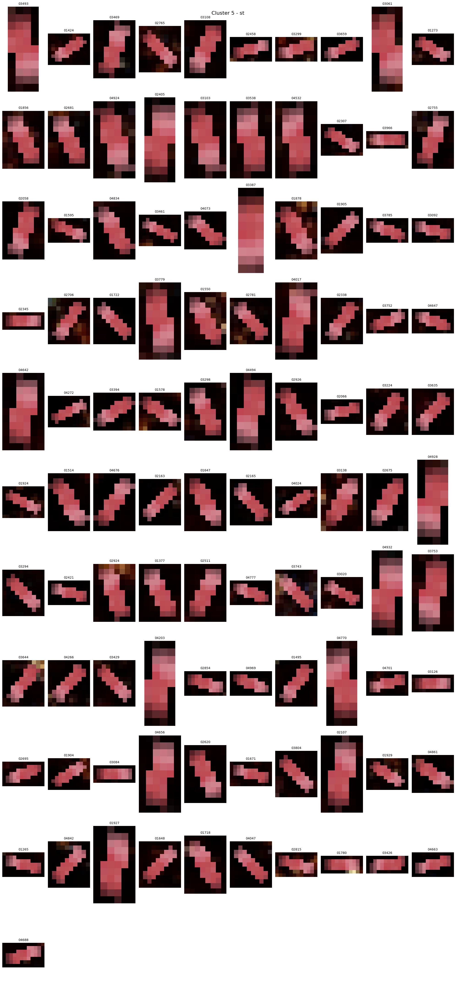

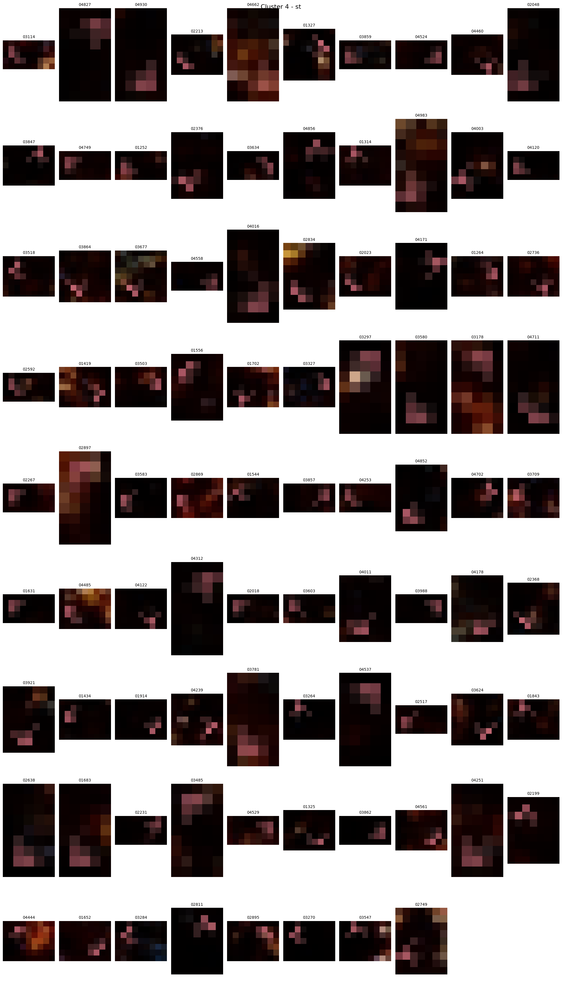

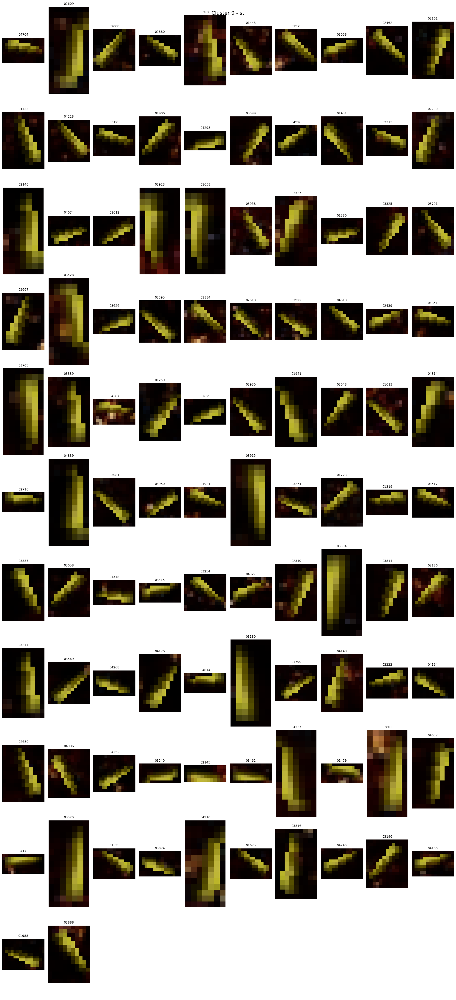

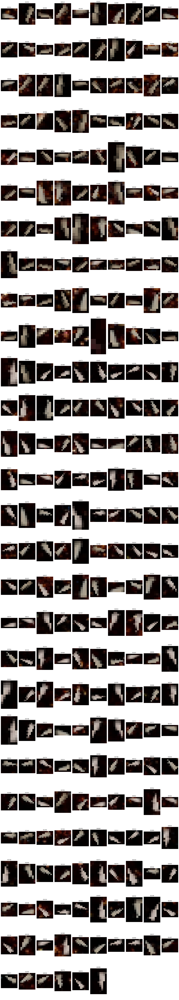

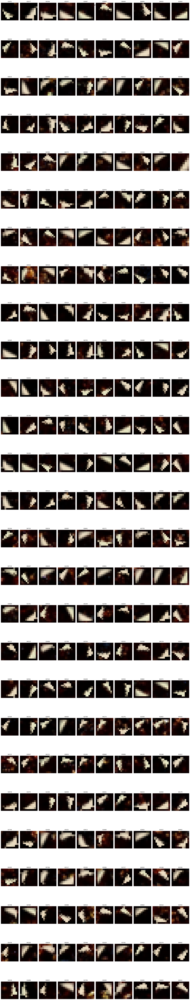

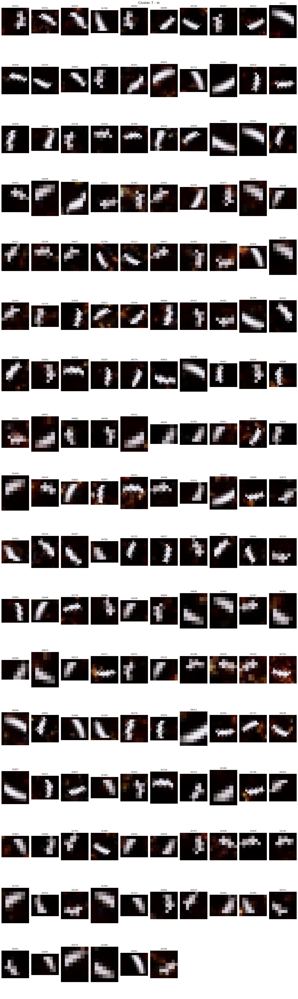

In [ ]:
# string
visualize_defects_by_cluster('st', bbox_info, file_clusters, image_folder_path)

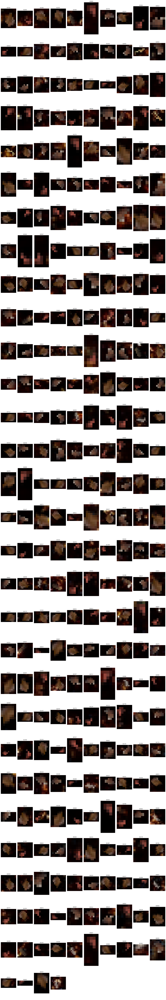

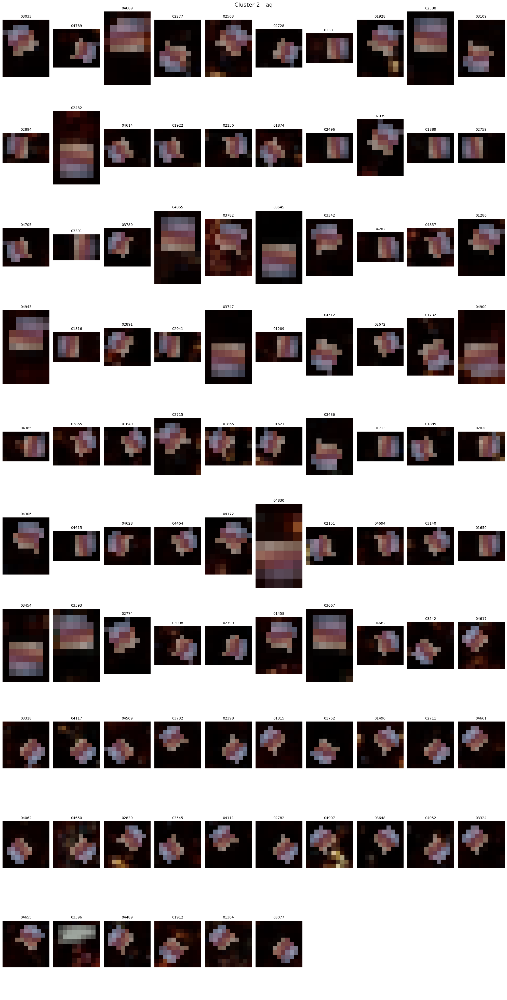

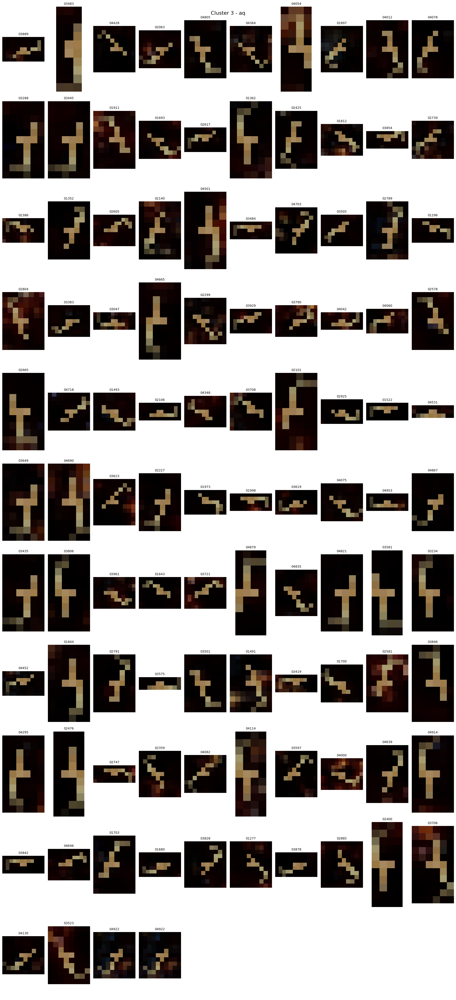

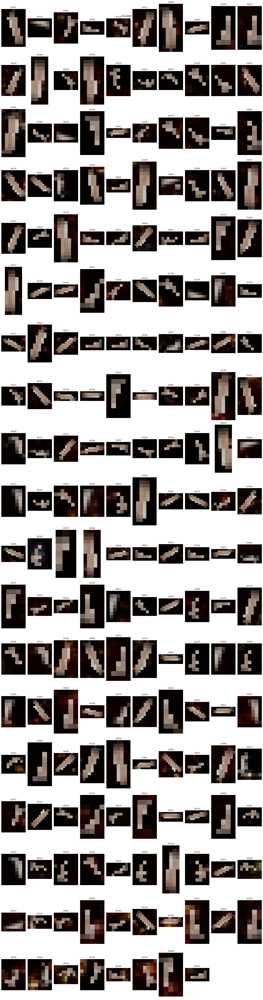

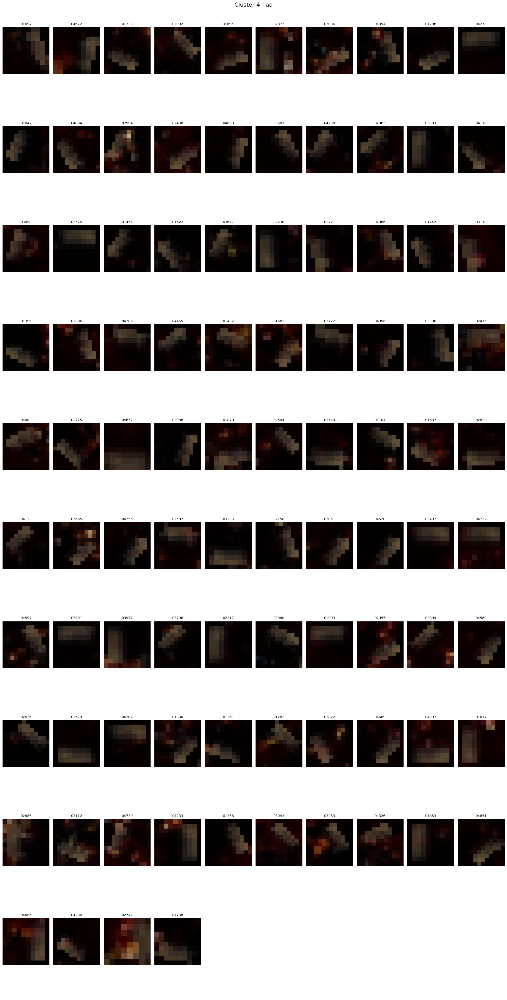

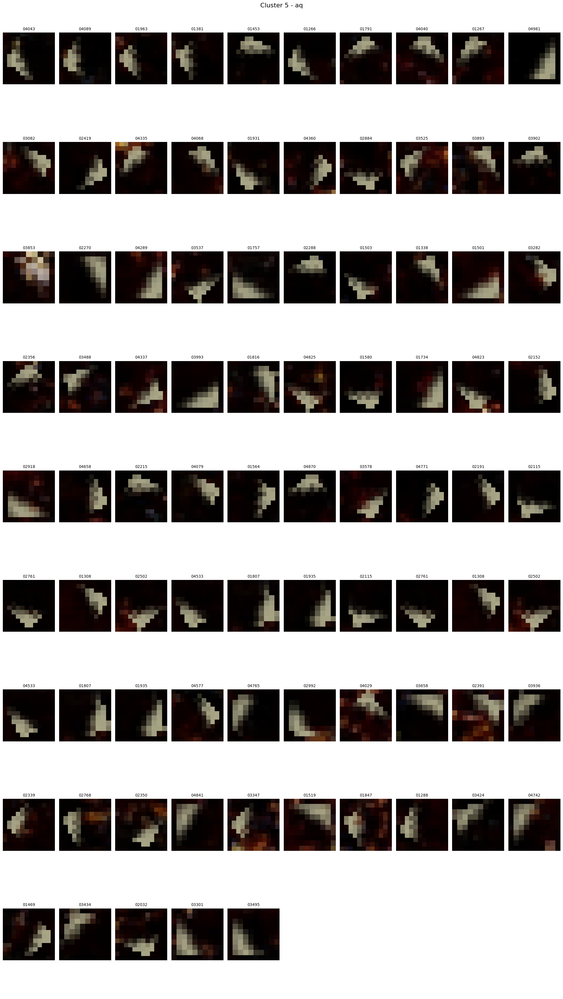

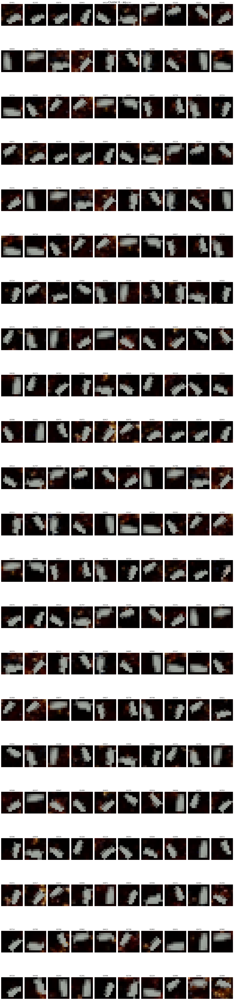

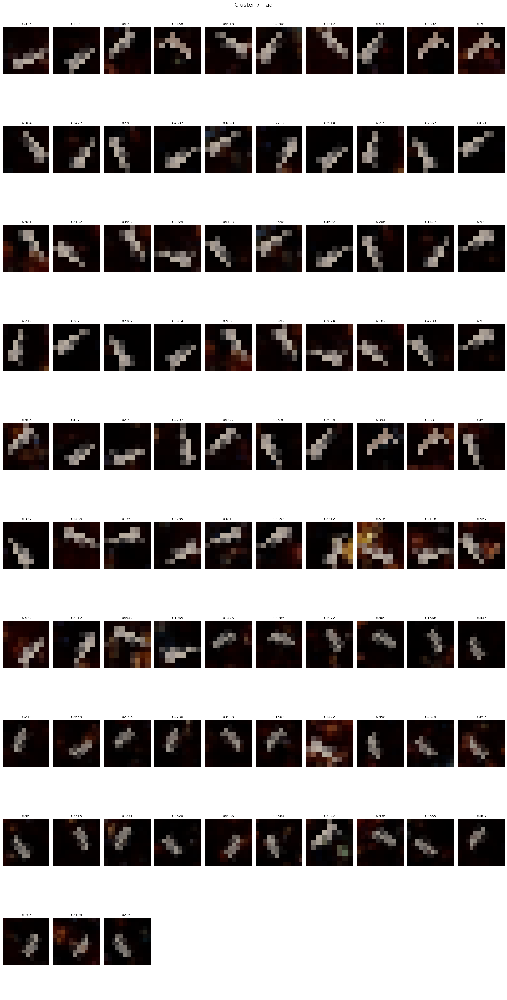

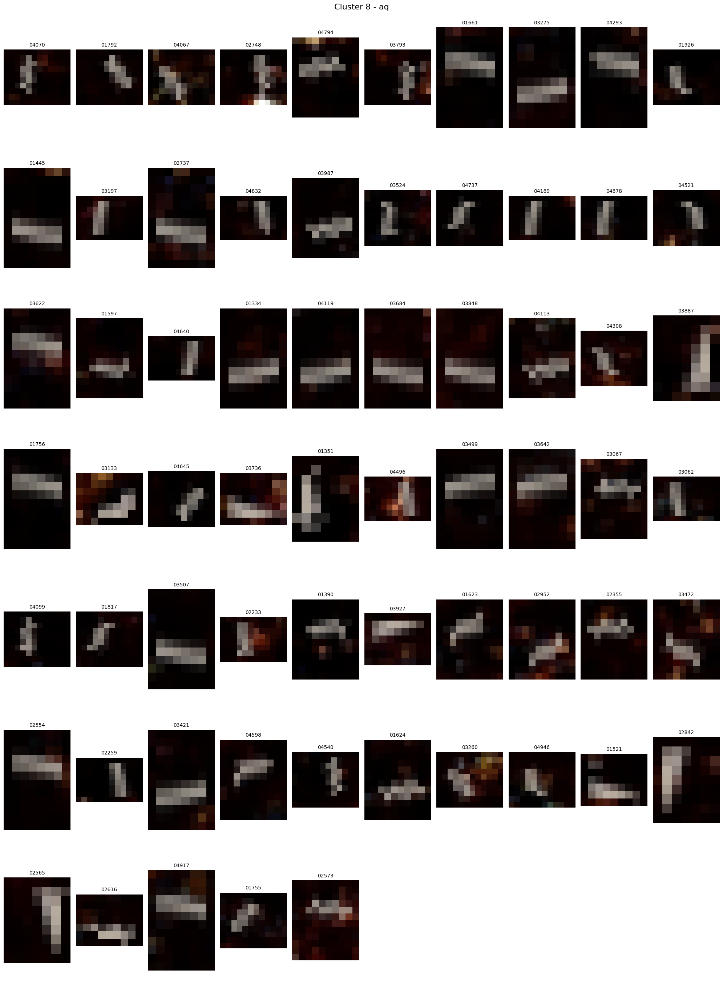

No images found in cluster 9.


In [ ]:
# aqua
visualize_defects_by_cluster('aq', bbox_info, file_clusters, image_folder_path)

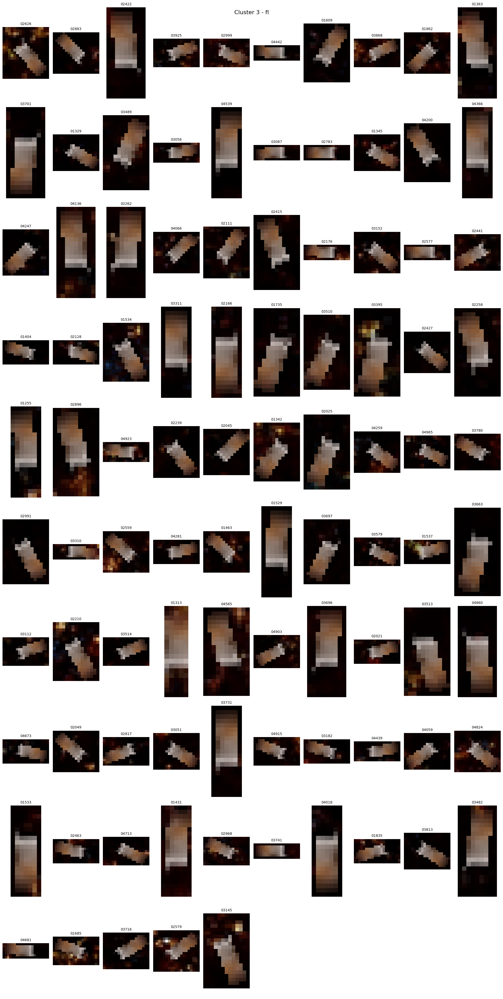

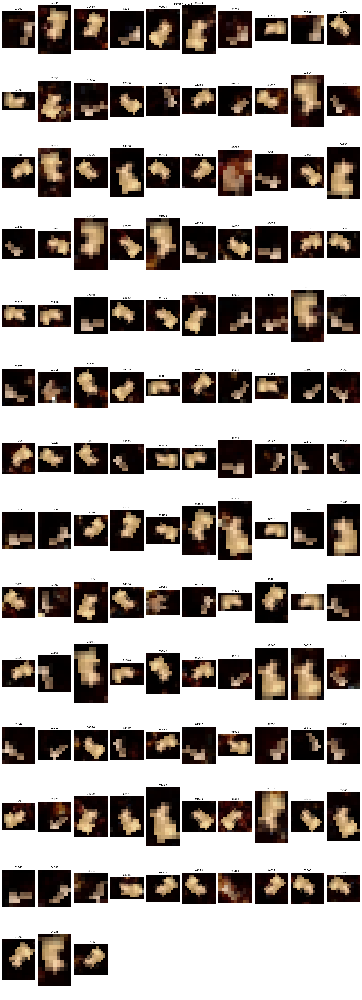

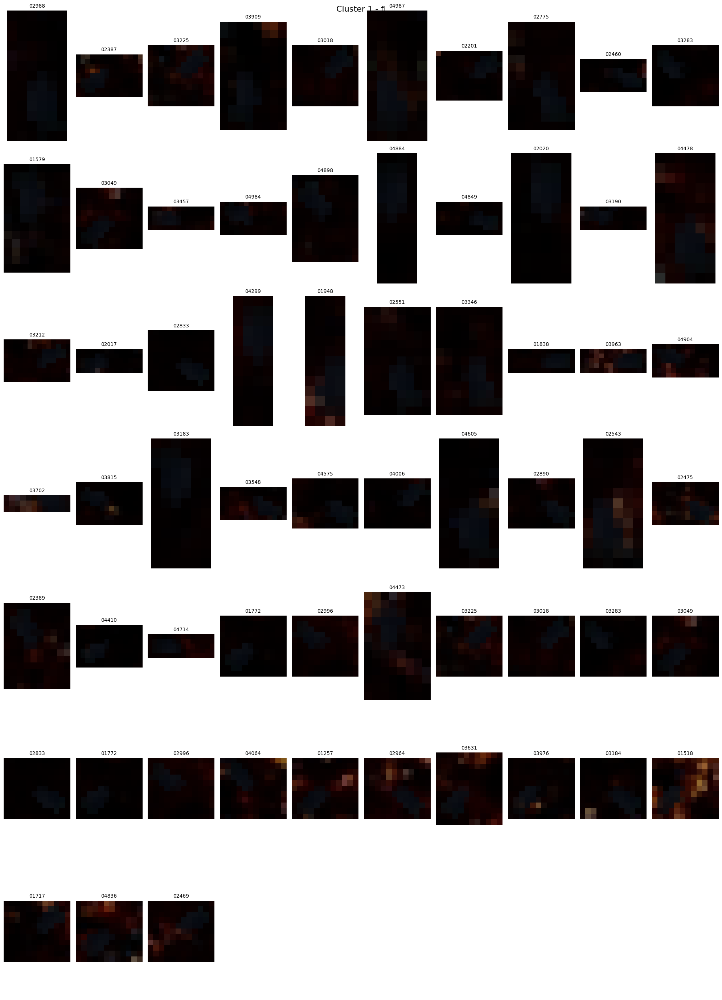

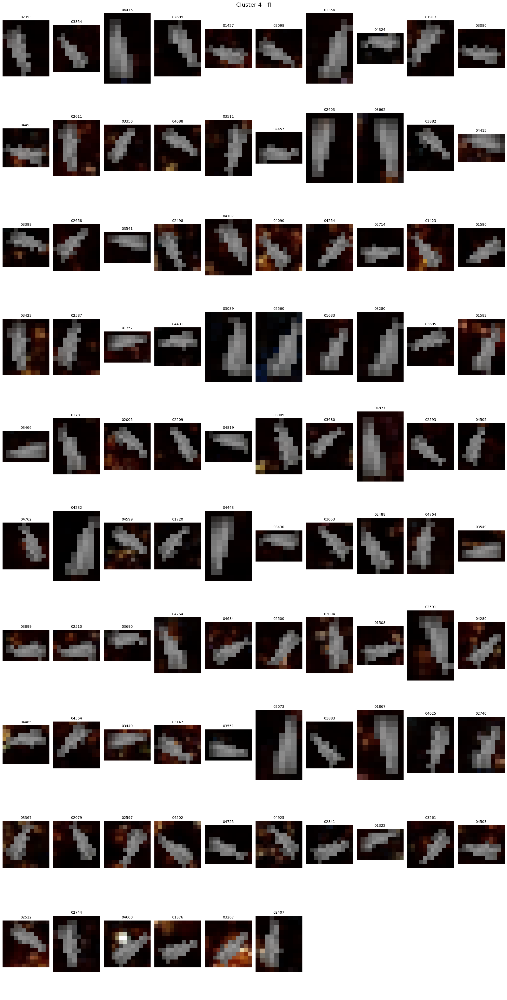

No images found in cluster 6.


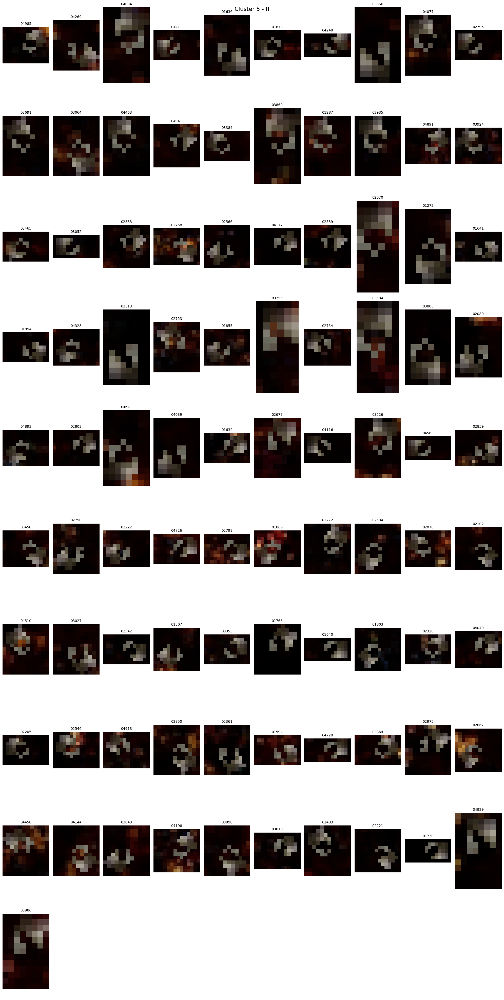

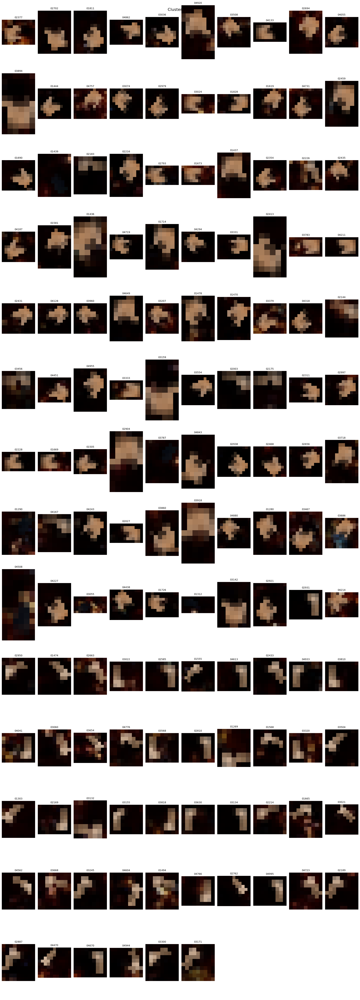

In [ ]:
# floating
visualize_defects_by_cluster('fl', bbox_info, file_clusters, image_folder_path)

## 2차 클러스터링 - 수동 라벨링

In [ ]:
## 특정 파일이 속한 클러스터 번호를 찾기

def find_cluster_for_file(defect, file_name, file_clusters):
    if defect in file_clusters:
        for cluster, files in file_clusters[defect].items():
            if file_name in files:
                return cluster
    return None

In [ ]:
## 클러스터 이동

def move_file_to_another_cluster(file_name, current_cluster, new_cluster, defect, file_clusters):
    # 현재 클러스터에서 파일 제거
    if file_name in file_clusters[defect][current_cluster]:
        file_clusters[defect][current_cluster].remove(file_name)
        print(f"File {file_name} removed from Cluster {current_cluster}")
    else:
        print(f"File {file_name} not found in Cluster {current_cluster}")
        return

    # 새로운 클러스터에 파일 추가
    if new_cluster not in file_clusters[defect]:
        file_clusters[defect][new_cluster] = []
    file_clusters[defect][new_cluster].append(file_name)
    print(f"File {file_name} moved to Cluster {new_cluster}")

In [ ]:
find_cluster_for_file('st', 'seaweed_04389.jpg', file_clusters)

8


In [ ]:
move_file_to_another_cluster("seaweed_04389.jpg", 8,1, "st", file_clusters)

File seaweed_04389.jpg removed from Cluster 8
File seaweed_04389.jpg moved to Cluster 1


In [ ]:
## 각 클러스터의 대표 이미지와 길이/비율/넓이 분포를 시각화

def visualize_cluster_distributions_with_image(file_clusters, bbox_info, image_folder_path, defect, num_per_row=4):

    clusters = list(file_clusters[defect].keys())
    num_rows = len(clusters) # 행 : 클러스터 개수
    fig, axs = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))

    for i, cluster in enumerate(clusters):
        files = file_clusters[defect][cluster]

        # 첫 번째 이미지 파일 (대표 이미지)
        first_image_file = files[0]
        image_path = os.path.join(image_folder_path, first_image_file)
        img = Image.open(image_path)

        # 바운딩 박스 정보 추출
        bbox_idx = next(j for j, info in enumerate(bbox_info[defect]) if info[0] == first_image_file)
        top_x, top_y, bot_x, bot_y = bbox_info[defect][bbox_idx][1:5]
        cropped_img = img.crop((top_x, top_y, bot_x, bot_y))

        # 이미지를 subplot에 표시
        axs[i, 0].imshow(cropped_img)
        axs[i, 0].axis('off')
        axs[i, 0].set_title(f'Cluster {cluster} Image')

        # 긴 부분의 길이 계산 및 분포
        widths, heights = [], []
        for file_name in files:
            bbox_idx = next(j for j, info in enumerate(bbox_info[defect]) if info[0] == file_name)
            top_x, top_y, bot_x, bot_y = bbox_info[defect][bbox_idx][1:5]
            width = bot_x - top_x
            height = bot_y - top_y
            widths.append(width)
            heights.append(height)

        long_side = [max(w, h) for w, h in zip(widths, heights)]
        aspect_ratios = [max(w, h) / min(w, h) for w, h in zip(widths, heights)]
        areas = [w * h for w, h in zip(widths, heights)]

        # 긴 부분 길이 분포
        axs[i, 1].hist(long_side, bins=10, alpha=0.7, color='green')
        axs[i, 1].set_title(f'Cluster {cluster} Long Side Length')
        axs[i, 1].set_xlabel('Length')
        axs[i, 1].set_ylabel('Frequency')

        # 가로/세로 비율 분포
        axs[i, 2].hist(aspect_ratios, bins=10, alpha=0.7, color='blue')
        axs[i, 2].set_title(f'Cluster {cluster} Aspect Ratio')
        axs[i, 2].set_xlabel('Ratio (Width/Height)')
        axs[i, 2].set_ylabel('Frequency')

        # 넓이 분포
        axs[i, 3].hist(areas, bins=10, alpha=0.7, color='red')
        axs[i, 3].set_title(f'Cluster {cluster} Area Distribution')
        axs[i, 3].set_xlabel('Area')
        axs[i, 3].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

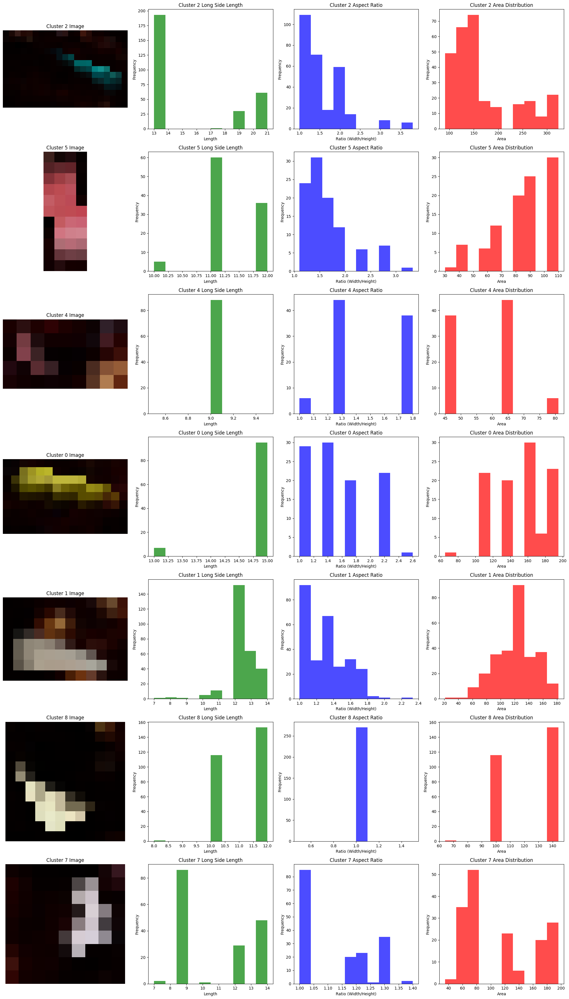

In [ ]:
visualize_cluster_distributions_with_image(file_clusters, bbox_info, image_folder_path, 'st')

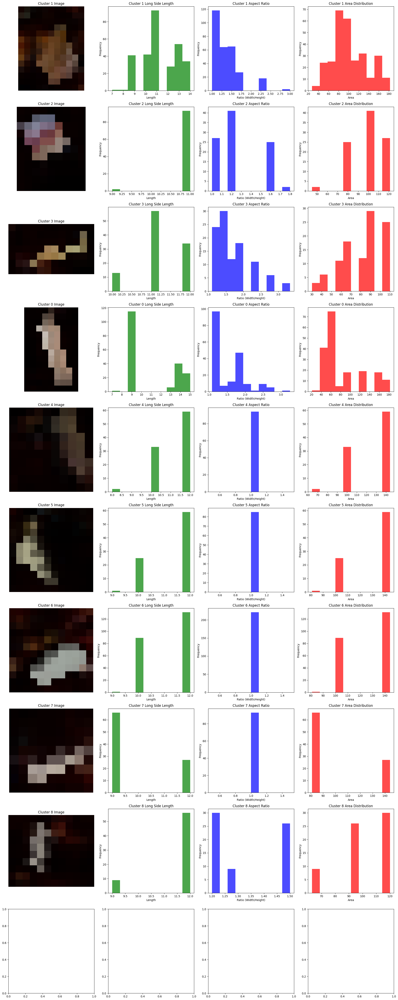

In [ ]:
visualize_cluster_distributions_with_image(file_clusters, bbox_info, image_folder_path, 'aq')

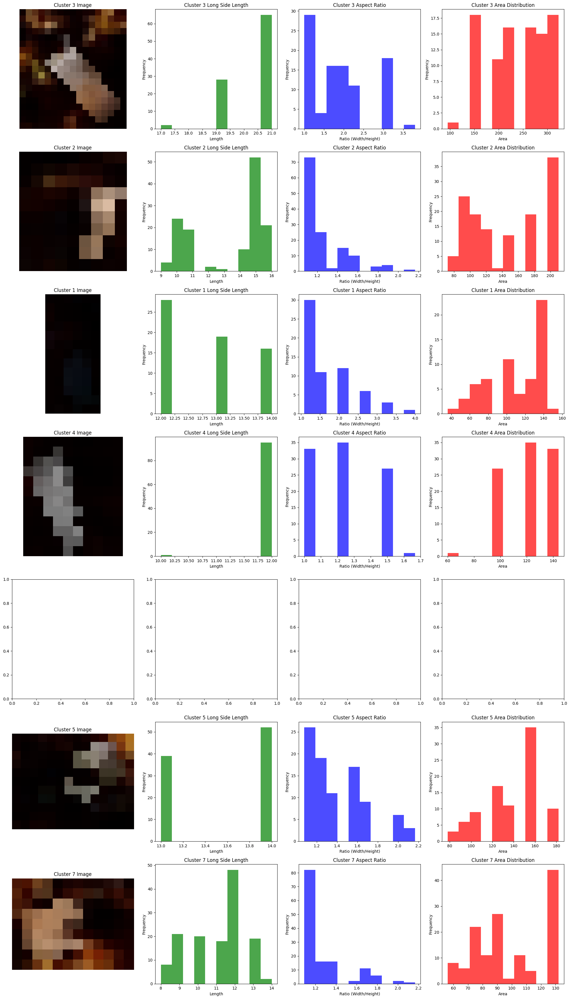

In [ ]:
visualize_cluster_distributions_with_image(file_clusters, bbox_info, image_folder_path, 'fl')

## 클러스터 정보 저장

In [ ]:
import csv
import pandas as pd

In [ ]:
def save_all_clusters_to_csv(file_clusters, output_path):
    with open(output_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Defect Type', 'File Name', 'Cluster Number'])
        for defect in file_clusters.keys():
            for cluster, files in file_clusters[defect].items():
                for file_name in files:
                    writer.writerow([defect, file_name, cluster])

In [ ]:
output_csv_path = 'file_clusters.csv'
save_all_clusters_to_csv(file_clusters, output_csv_path)

In [ ]:
df = pd.read_csv('file_clusters.csv')
df

,Defect Type,File Name,Cluster Number
0,aq,seaweed_03762.jpg,1
1,aq,seaweed_01845.jpg,1
2,aq,seaweed_01498.jpg,1
3,aq,seaweed_02707.jpg,1
4,aq,seaweed_02590.jpg,1
...,...,...,...
2995,st,seaweed_01805.jpg,7
2996,st,seaweed_02575.jpg,7
2997,st,seaweed_02380.jpg,7
2998,st,seaweed_04061.jpg,7


# 데이터 증강

## Defected 이미지 (floating 유형) - 수직 / 수평 뒤집기 기법

In [ ]:
import random
from torchvision import transforms
import shutil

In [ ]:
## 결함 파일명 추출

def find_defect_files(json_folder, defect_class):

    defect_json_files = []
    json_files = [f for f in os.listdir(json_folder) if f.endswith('.json')]

    for json_file in json_files:
        json_path = os.path.join(json_folder, json_file)
        with open(json_path, 'r') as jf:
            data = json.load(jf)
            if data.get('defect_class') == defect_class:
                defect_json_files.append(json_file)

    return defect_json_files

In [ ]:
## 랜덤하게 수직/수평 뒤집기 수행

def augment_images_with_fl_defects(image_folder_path, json_folder_path, output_image_folder, output_json_folder, defect_json_files):

    if not os.path.exists(output_image_folder):
        os.makedirs(output_image_folder)
    if not os.path.exists(output_json_folder):
        os.makedirs(output_json_folder)

    # 수평 및 수직 뒤집기 개수 카운트
    horizontal_flip_count = 0
    vertical_flip_count = 0

    # JSON 파일 목록 순회
    for json_file in defect_json_files:
        json_path = os.path.join(json_folder_path, json_file)

        # 이미지 파일 이름 추출 (확장자는 항상 .png)
        image_name = json_file.replace('.json', '.png')
        image_path = os.path.join(image_folder_path, image_name)
        img = Image.open(image_path)

        # 수평 또는 수직 뒤집기 랜덤 적용
        flip_type, flip_suffix = random.choice([(Image.FLIP_LEFT_RIGHT, '_h_flip'), (Image.FLIP_TOP_BOTTOM, '_v_flip')])

        # 이미지 뒤집기
        flipped_img = img.transpose(flip_type)
        flipped_image_name = f"{os.path.splitext(image_name)[0]}{flip_suffix}.png"
        flipped_image_path = os.path.join(output_image_folder, flipped_image_name)
        flipped_img.save(flipped_image_path)

        # JSON 파일 복사 및 수정
        with open(json_path, 'r') as jf:
            data = json.load(jf)

        flipped_data = data.copy()
        flipped_data['image_name'] = flipped_image_name  # 이미지 이름 업데이트

        if flip_type == Image.FLIP_LEFT_RIGHT:
            # 수평 뒤집기 : x 좌표 반전
            flipped_data['top_x'], flipped_data['bot_x'] = img.width - data['bot_x'], img.width - data['top_x']
            horizontal_flip_count += 1
        elif flip_type == Image.FLIP_TOP_BOTTOM:
            # 수직 뒤집기 : y 좌표 반전
            flipped_data['top_y'], flipped_data['bot_y'] = img.height - data['bot_y'], img.height - data['top_y']
            vertical_flip_count += 1

        # 수정된 JSON 저장
        flipped_json_path = os.path.join(output_json_folder, f"{os.path.splitext(json_file)[0]}{flip_suffix}.json")
        with open(flipped_json_path, 'w') as jf:
            json.dump(flipped_data, jf)

    print(f"총 {len(fl_json_files)}개의 이미지 증강 완료")
    print(f"수평 뒤집기 적용 개수: {horizontal_flip_count}")
    print(f"수직 뒤집기 적용 개수: {vertical_flip_count}")

In [ ]:
output_image_folder = '/content/train/defected_augmented_images'
output_json_folder = '/content/train/defected_augmented_json'

# 1. 'fl'인 JSON 파일명 리스트 찾기
fl_json_files = find_defect_files(json_folder_path, defect_class='fl')

# 2. 해당 리스트의 파일들에 대해 증강 수행
augment_images_with_fl_defects(image_folder_path, json_folder_path, output_image_folder, output_json_folder, fl_json_files)

총 623개의 이미지 증강 완료
수평 뒤집기 적용 개수: 319
수직 뒤집기 적용 개수: 304


In [ ]:
## 결함 시각화

def get_bbox_aspect_ratio(bbox):

    width = bbox['bot_x'] - bbox['top_x']
    height = bbox['bot_y'] - bbox['top_y']

    longer_side = max(width, height)
    shorter_side = min(width, height)

    return longer_side / shorter_side

def visualize_defect_in_image(image_path, json_path, zoom_factor=2):

    image = Image.open(image_path).convert("RGB")

    with open(json_path, 'r') as f:
        defect_info = json.load(f)

    # 바운딩 박스 정보 가져오기
    top_x = defect_info["top_x"]
    top_y = defect_info["top_y"]
    bot_x = defect_info["bot_x"]
    bot_y = defect_info["bot_y"]

    # 바운딩 박스 비율 계산
    bbox_aspect_ratio = get_bbox_aspect_ratio(defect_info)
    print(f"Aspect Ratio of Bounding Box in {os.path.basename(image_path)}: {bbox_aspect_ratio:.2f}")

    # 결함 부분 확대
    cropped_image = image.crop((top_x, top_y, bot_x, bot_y))
    width, height = cropped_image.size
    zoomed_image = cropped_image.resize((int(width * zoom_factor), int(height * zoom_factor)))

    plt.imshow(zoomed_image)
    plt.axis('off')
    plt.show()

Aspect Ratio of Bounding Box in seaweed_01254_v_flip.png: 1.07


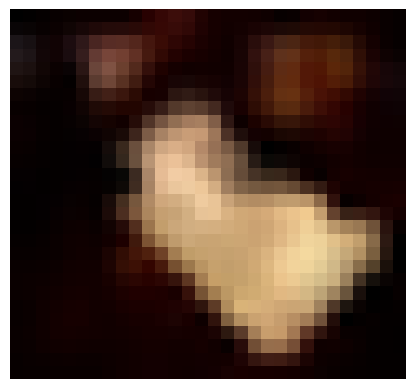

In [ ]:
# 증강 이미지
image_path = '/content/train/defected_augmented_images/seaweed_01254_v_flip.png'
json_path = '/content/train/defected_augmented_json/seaweed_01254_v_flip.json'

visualize_defect_in_image(image_path, json_path, zoom_factor=2)

Aspect Ratio of Bounding Box in seaweed_01254.png: 1.07


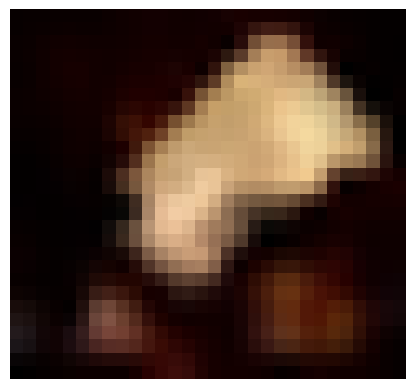

In [ ]:
# 원본 이미지
image_path = '/content/train/train_defected_dataset/seaweed_01254.png'
json_path = '/content/train/train_defected_json/seaweed_01254.json'

visualize_defect_in_image(image_path, json_path, zoom_factor=2)

## Pure 이미지 - Mixup 기법

In [ ]:
def mixup_images(input_folder, output_folder, num_images, alpha=1):

    # 이미지 -> 텐서 변환
    transform = transforms.ToTensor()

    os.makedirs(output_folder, exist_ok=True)

    images = [f for f in os.listdir(input_folder) if f.endswith('.jpg')]

    # Mixup 수행
    for i in range(num_images):
        # 랜덤하게 두 개의 이미지 선택
        img1_path = os.path.join(input_folder, random.choice(images))
        img2_path = os.path.join(input_folder, random.choice(images))

        # 이미지 열기
        img1 = Image.open(img1_path).convert('RGB')
        img2 = Image.open(img2_path).convert('RGB')
        x1 = transform(img1)
        x2 = transform(img2)

        # alpha 값으로 lambda 값 샘플링 후 mixup
        lam = np.random.beta(alpha, alpha)
        mixed_x = lam * x1 + (1 - lam) * x2

        # 텐서 -> 이미지 변환
        mixed_image = transforms.ToPILImage()(mixed_x)

        mixed_image_path = os.path.join(output_folder, f"seaweed_0{5000+i}.jpg")
        mixed_image.save(mixed_image_path)

In [ ]:
input_folder = '/content/train/train_pure_dataset'
output_folder = '/content/train/pure_augment'
num_images = 2600

mixup_images(input_folder, output_folder, num_images)

## 폴더 병합

In [ ]:
def merge_folders(source_folder, destination_folder):

    for file_name in os.listdir(source_folder):
        source_path = os.path.join(source_folder, file_name)
        destination_path = os.path.join(destination_folder, file_name)
        shutil.move(source_path, destination_path)

    print(f"{source_folder} 파일이 {destination_folder}로 이동되었습니다.")

In [ ]:
source_folder = "/content/train/defected_augmented_json"
destination_folder = "/content/train/train_defected_json"

merge_folders(source_folder, destination_folder)

/content/train/defected_augmented_json 파일이 /content/train/train_defected_json로 이동되었습니다.


In [ ]:
source_folder = "/content/train/defected_augmented_images"
destination_folder = "/content/train/train_defected_dataset"

merge_folders(source_folder, destination_folder)

/content/train/defected_augmented_images 파일이 /content/train/train_defected_dataset로 이동되었습니다.


In [ ]:
source_folder = "/content/train/pure_augment"
destination_folder = "/content/train/train_pure_dataset"

merge_folders(source_folder, destination_folder)

/content/train/pure_augment 파일이 /content/train/train_pure_dataset로 이동되었습니다.
